In [806]:
# library(SingleCellExperiment)
# library(scran)
# library(scater)

In [807]:
filename = "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/full_counts_sce.Rds"

In [808]:
sce_all = readRDS(filename)
sce = sce_all

In [809]:
# make sure to remove pre-existing size factors, previously computed log counts
assay(sce, "logcounts") <- NULL
sizeFactors(sce) <- NULL

In [810]:
##### Note this step is hard-coded
# partial and full datasets might not and often will not be subsamples of a single sce object

In [811]:
table(sce$dataset)


   Groningen_Nawijn_2019VieiraBraga   Northwestern_Misharin_2018Reyfman 
                              11110                               41778 
         Sanger_Meyer_2019Madissoon Vanderbilt_Kropski_bioRxivHabermann 
                              56711                               31644 

In [812]:
sce = sce[,sce$dataset == 'Groningen_Nawijn_2019VieiraBraga']

In [813]:
sce

class: SingleCellExperiment 
dim: 45065 11110 
metadata(0):
assays(1): counts
rownames(45065): RP11-34P13.3 FAM138A ... C11orf71.1 LINC01481.1
rowData names(0):
colnames(11110): TAGTGGTTCCAAACAC_ARMS026_VieiraBraga
  TACTTACCACGTCTCT_ARMS026_VieiraBraga ...
  CTGATAGAGCGTCAAG_ARMS051_VieiraBraga
  AGGGATGAGATCCGAG_ARMS032_VieiraBraga
colData names(18): index age ... smoking total_counts
reducedDimNames(0):
spikeNames(0):
altExpNames(0):

In [781]:
table(sce$sample)


ARMS026 ARMS032 ARMS038 ARMS040 ARMS051 ARMS054 
   2082    1615    1493    1005    2876    2039 

In [782]:
### select samples
# sample1 = 'ARMS026'
# sample1 = 'ARMS032'
# sample1 = 'ARMS038'
# sample1 = 'ARMS040'
# sample1 = 'ARMS051'
sample1 = 'ARMS054'
##
# sample2 = 'ARMS026'
# sample2 = 'ARMS032'
# sample2 = 'ARMS038'
# sample2 = 'ARMS040'
sample2 = 'ARMS051'
# sample2 = 'ARMS054'

In [783]:
# will act as full dataset
sce1 = sce[,sce$sample == sample1]
# will act as partial (incomplete) dataset
sce2 = sce[,sce$sample == sample2]

In [784]:
sce_all = sce
sce_all1 = sce1
sce_all2 = sce2

In [785]:
unique(colData(sce1)$ann_level_1)
unique(colData(sce1)$ann_level_2)
unique(colData(sce1)$ann_level_3)
unique(colData(sce1)$ann_level_4)

[1] "Epithelial"  "Endothelial" "Stroma"      "Immune"

[1] "Airway epithelium"  "Blood vessels"      "Smooth Muscle"     
[4] "Submucosal Gland"   "Lymphoid"           "Cycling cells"     
[7] "Fibroblast lineage" "Myeloid"

[1] "Basal"                "Secretory"            "Ciliated lineage"    
 [4] "Venous"               "Airway smooth muscle" "Submucosal Secretory"
 [7] "B cell lineage"       "Arterial"             "2_Cycling cells"     
[10] "Fibroblasts"          "Macrophages"          "Monocytes"

[1] "Basal resting"            "Basal diff?"             
 [3] "Club"                     "Suprabasal"              
 [5] "Ciliated"                 "Venous EC"               
 [7] "Basal cycling"            "3_Airway smooth muscle"  
 [9] "3_Submucosal Secretory"   "3_B cell lineage"        
[11] "Arterial EC"              "Goblet-1"                
[13] "2_Cycling cells"          "Mucous ciliated"         
[15] "3_Fibroblasts"            "Not alveolar macrophages"
[17] "Alveolar macrophages"     "3_Monocytes"

In [786]:
# unique(colData(sce2)$ann_level_1)
# unique(colData(sce2)$ann_level_2)
# unique(colData(sce2)$ann_level_3)
# unique(colData(sce2)$ann_level_4)

In [787]:
celltypes1 = as.character(unique(sce1$ann_level_3))
celltypes2 = as.character(unique(sce2$ann_level_3))

In [788]:
celltypes = celltypes1[celltypes1 %in% celltypes2]
celltypes = celltypes[!(is.na(celltypes))]
celltypes

[1] "Basal"                "Secretory"            "Ciliated lineage"    
 [4] "Venous"               "Airway smooth muscle" "Submucosal Secretory"
 [7] "B cell lineage"       "Arterial"             "2_Cycling cells"     
[10] "Fibroblasts"          "Macrophages"          "Monocytes"

In [789]:
select_genes <- function(dec,n){
    dec = dec[order(dec$mean),]
    m = min(dec$mean)
    M = max(dec$mean)
    genes = c()
    for (i in seq(m,M,length.out=n)){
        genes = c(genes,names(head(dec$mean[dec$mean>i],1)))
    }
    genes
}

In [790]:
mydir = "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/"
vb_dir = paste0(mydir,"Vieira_folder/")

In [791]:
for (celltype in celltypes){
    print(celltype)
    sce1 = sce_all1[,sce_all1$ann_level_3 == celltype]
    sce2 = sce_all2[,sce_all2$ann_level_3 == celltype]
    if (ncol(sce1) ==1 | ncol(sce2) ==1){break}
    ## sce1
    sce = sce1
    # use edgeR to compute (log2) CPM
    logcounts(sce) = edgeR::cpm(counts(sce), log = TRUE, prior.count = 0.1)
    # compute mean variance trend (for sce1)
    dec1 <- scran::modelGeneVar(sce)
    sce1 = sce
    ## sce1
    sce = sce2
    # use edgeR to compute (log2) CPM
    logcounts(sce) = edgeR::cpm(counts(sce), log = TRUE, prior.count = 0.1)
    # compute mean variance trend (for sce2, before subsetting to only few genes)
    dec2 <- scran::modelGeneVar(sce)
    # select (10 genes) at intervals along the mean
    selected_genes = select_genes(dec2, n=11)
    ## now actually make sce2 partial
    # after saving total counts
    sce$total_counts = colSums(counts(sce))
    # select down on only present genes
    sce = sce[selected_genes,]
    assay(sce, "logcounts") <- NULL
    # re normalise (using total counts)
    logcounts(sce) = edgeR::cpm(counts(sce), log = TRUE, lib.size = sce$total_counts, prior.count = 0.1)
    sce2 = sce
    # make df to save
    df = data.frame(mean = rowMeans(logcounts(sce2)), 
                sampled_variance = rowVars(logcounts(sce2)),
               est_from_full_variance = metadata(dec1)$trend(rowMeans(logcounts(sce2))),
               est_from_partial_variance_when_present = metadata(dec2)$trend(rowMeans(logcounts(sce2))))
    df$n_cells_sample1 = ncol(sce1)
    df$n_cells_sample2 = ncol(sce2)
    celltype = gsub("/","_",celltype)
    celltype = gsub(" ","_",celltype)
    filename = paste0(vb_dir,"celltype_",celltype,".full_sample_",sample1,".partial_sample_",sample2,".csv")
    print(filename)
    write.csv(df, filename)
    
}

[1] "Basal"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/Vieira_folder/celltype_Basal.full_sample_ARMS054.partial_sample_ARMS051.csv"
[1] "Secretory"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/Vieira_folder/celltype_Secretory.full_sample_ARMS054.partial_sample_ARMS051.csv"
[1] "Ciliated lineage"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/Vieira_folder/celltype_Ciliated_lineage.full_sample_ARMS054.partial_sample_ARMS051.csv"
[1] "Venous"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/Vieira_folder/celltype_Venous.full_sample_ARMS054.partial_sample_ARMS051.csv"
[1] "Airway smooth muscle"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/Vieira_folder/celltype_Airway_smooth_muscle.full_sample_ARMS054.partial_sample_ARMS051.csv"
[1] "Submucosal Secretory"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/Vieira_folder/celltype_Submucosal_Secretory.full_sample_ARMS054.partial_sample_ARMS051.csv"
[1] "B cell lineage"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/Vieira_folder/celltype_B_cell_lineage.full_sample_ARMS054.partial_sample_ARMS051.csv"
[1] "Arterial"


Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”Warning message in regularize.values(x, y, ties, missing(ties)):
“collapsing to unique 'x' values”

[1] "/hps/nobackup/stegle/users/acuomo/all_scripts/covid/variance_dfs/Vieira_folder/celltype_Arterial.full_sample_ARMS054.partial_sample_ARMS051.csv"
[1] "2_Cycling cells"


In [792]:
myfiles = list.files(vb_dir)
myfiles

[1] "celltype_2_Cycling_cells.full_sample_ARMS026.partial_sample_ARMS051.csv"     
  [2] "celltype_2_Cycling_cells.full_sample_ARMS051.partial_sample_ARMS026.csv"     
  [3] "celltype_Airway_smooth_muscle.full_sample_ARMS026.partial_sample_ARMS032.csv"
  [4] "celltype_Airway_smooth_muscle.full_sample_ARMS026.partial_sample_ARMS051.csv"
  [5] "celltype_Airway_smooth_muscle.full_sample_ARMS032.partial_sample_ARMS026.csv"
  [6] "celltype_Airway_smooth_muscle.full_sample_ARMS032.partial_sample_ARMS051.csv"
  [7] "celltype_Airway_smooth_muscle.full_sample_ARMS051.partial_sample_ARMS026.csv"
  [8] "celltype_Airway_smooth_muscle.full_sample_ARMS051.partial_sample_ARMS032.csv"
  [9] "celltype_Airway_smooth_muscle.full_sample_ARMS054.partial_sample_ARMS026.csv"
 [10] "celltype_Airway_smooth_muscle.full_sample_ARMS054.partial_sample_ARMS032.csv"
 [11] "celltype_Airway_smooth_muscle.full_sample_ARMS054.partial_sample_ARMS051.csv"
 [12] "celltype_Arterial.full_sample_ARMS026.partial_sample_ARMS032.csv"            
 [13] "celltype_Arterial.full_sample_ARMS026.partial_sample_ARMS040.csv"            
 [14] "celltype_Arterial.full_sample_ARMS026.partial_sample_ARMS051.csv"            
 [15] "celltype_Arterial.full_sample_ARMS032.partial_sample_ARMS026.csv"            
 [16] "celltype_Arterial.full_sample_ARMS032.partial_sample_ARMS040.csv"            
 [17] "celltype_Arterial.full_sample_ARMS032.partial_sample_ARMS051.csv"            
 [18] "celltype_Arterial.full_sample_ARMS038.partial_sample_ARMS026.csv"            
 [19] "celltype_Arterial.full_sample_ARMS038.partial_sample_ARMS032.csv"            
 [20] "celltype_Arterial.full_sample_ARMS038.partial_sample_ARMS040.csv"            
 [21] "celltype_Arterial.full_sample_ARMS038.partial_sample_ARMS051.csv"            
 [22] "celltype_Arterial.full_sample_ARMS040.partial_sample_ARMS026.csv"            
 [23] "celltype_Arterial.full_sample_ARMS040.partial_sample_ARMS032.csv"            
 [24] "celltype_Arterial.full_sample_ARMS040.partial_sample_ARMS038.csv"            
 [25] "celltype_Arterial.full_sample_ARMS040.partial_sample_ARMS051.csv"            
 [26] "celltype_Arterial.full_sample_ARMS051.partial_sample_ARMS026.csv"            
 [27] "celltype_Arterial.full_sample_ARMS051.partial_sample_ARMS032.csv"            
 [28] "celltype_Arterial.full_sample_ARMS051.partial_sample_ARMS040.csv"            
 [29] "celltype_Arterial.full_sample_ARMS054.partial_sample_ARMS026.csv"            
 [30] "celltype_Arterial.full_sample_ARMS054.partial_sample_ARMS032.csv"            
 [31] "celltype_Arterial.full_sample_ARMS054.partial_sample_ARMS040.csv"            
 [32] "celltype_Arterial.full_sample_ARMS054.partial_sample_ARMS051.csv"            
 [33] "celltype_B_cell_lineage.full_sample_ARMS026.partial_sample_ARMS032.csv"      
 [34] "celltype_B_cell_lineage.full_sample_ARMS026.partial_sample_ARMS038.csv"      
 [35] "celltype_B_cell_lineage.full_sample_ARMS026.partial_sample_ARMS040.csv"      
 [36] "celltype_B_cell_lineage.full_sample_ARMS026.partial_sample_ARMS051.csv"      
 [37] "celltype_B_cell_lineage.full_sample_ARMS032.partial_sample_ARMS026.csv"      
 [38] "celltype_B_cell_lineage.full_sample_ARMS032.partial_sample_ARMS040.csv"      
 [39] "celltype_B_cell_lineage.full_sample_ARMS032.partial_sample_ARMS051.csv"      
 [40] "celltype_B_cell_lineage.full_sample_ARMS040.partial_sample_ARMS026.csv"      
 [41] "celltype_B_cell_lineage.full_sample_ARMS040.partial_sample_ARMS032.csv"      
 [42] "celltype_B_cell_lineage.full_sample_ARMS040.partial_sample_ARMS038.csv"      
 [43] "celltype_B_cell_lineage.full_sample_ARMS040.partial_sample_ARMS051.csv"      
 [44] "celltype_B_cell_lineage.full_sample_ARMS051.partial_sample_ARMS026.csv"      
 [45] "celltype_B_cell_lineage.full_sample_ARMS051.partial_sample_ARMS032.csv"      
 [46] "celltype_B_cell_lineage.full_sample_ARMS051.partial_sample_ARMS040.csv"      
 [47] "celltype_B_cell_lineage.full_sample_ARMS054.partial_sample_ARMS026.csv"      
 [48] "

In [793]:
make_plotting_df <- function(df){
    df0 = df[,c("mean","sampled_variance")]
    colnames(df0) <- c("mean","variance")
    df0$type = 'sample_variance_sample2'
    df1 = df[,c("mean","est_from_full_variance")]
    colnames(df1) <- c("mean","variance")
    df1$type = 'var_estimated_from_mean_var_trend_from_sample1'
    df2 = df[,c("mean","est_from_partial_variance_when_present")]
    colnames(df2) <- c("mean","variance")
    df2$type = 'var_estimated_from_mean_var_trend_from_sample2'
    rbind(df0,df1,df2)
}

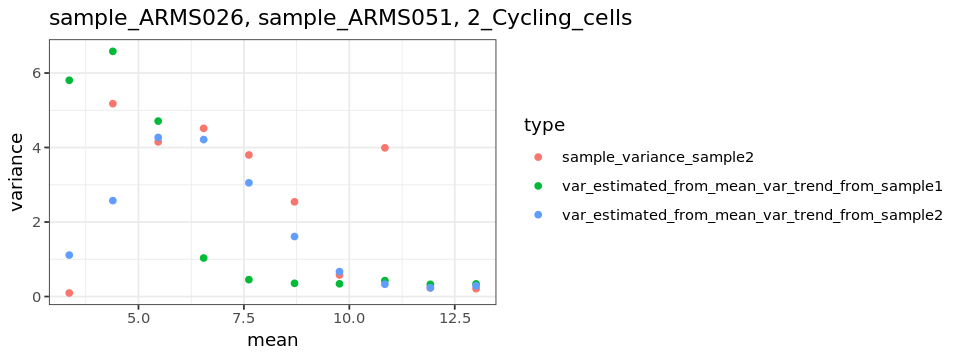

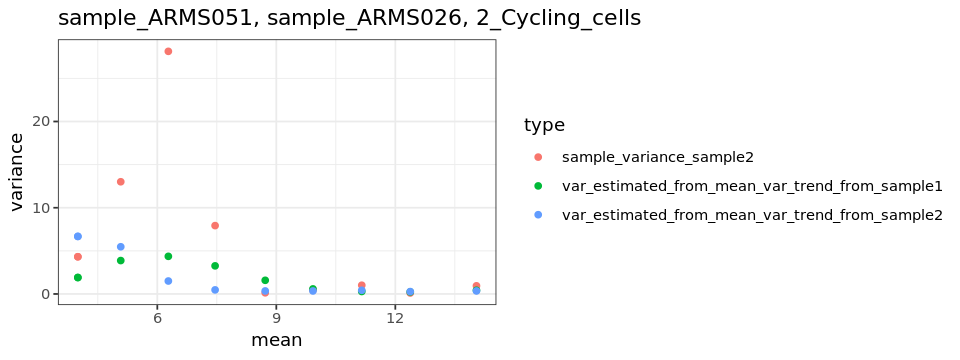

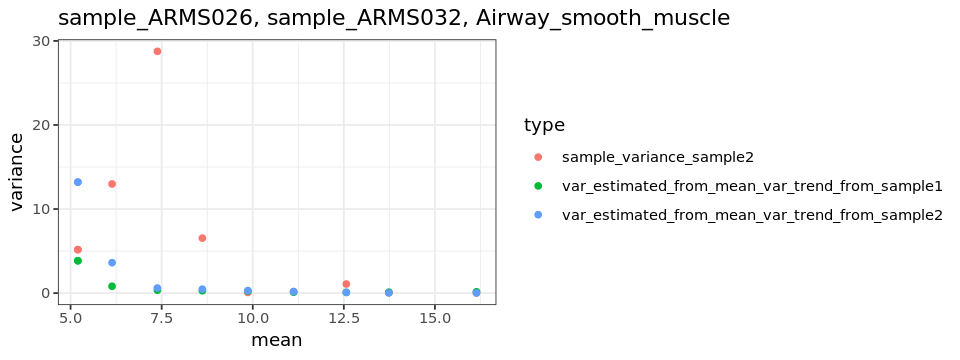

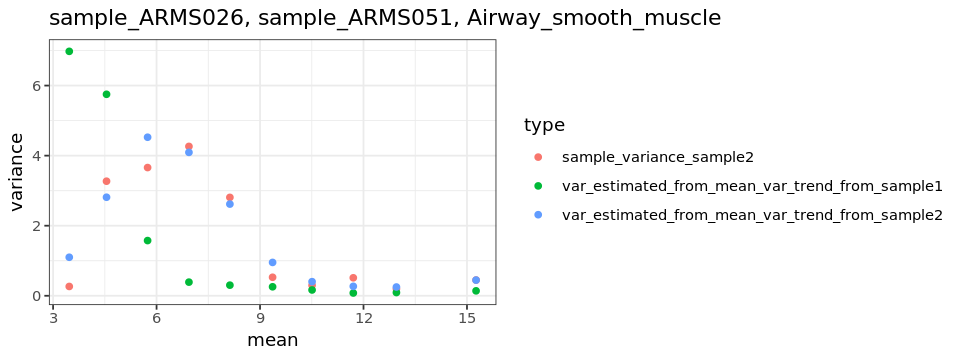

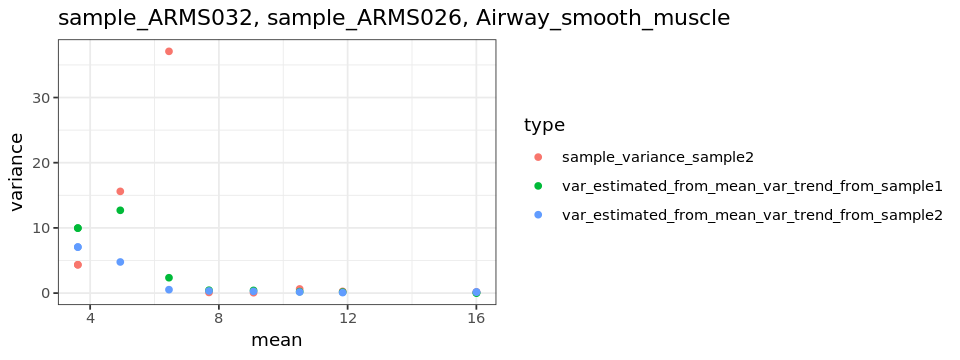

...

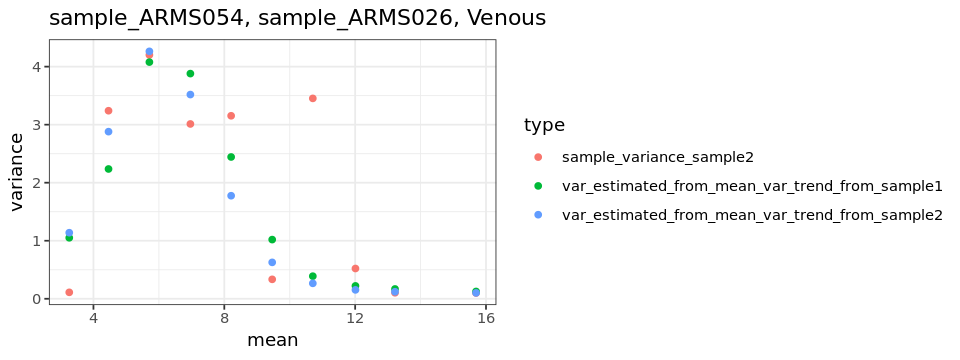

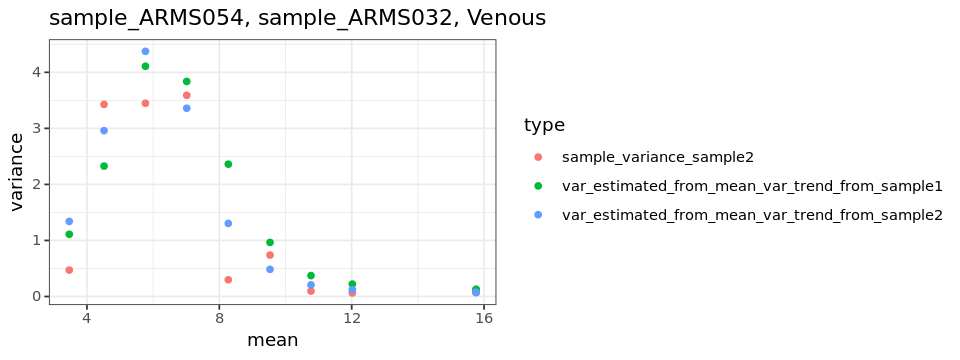

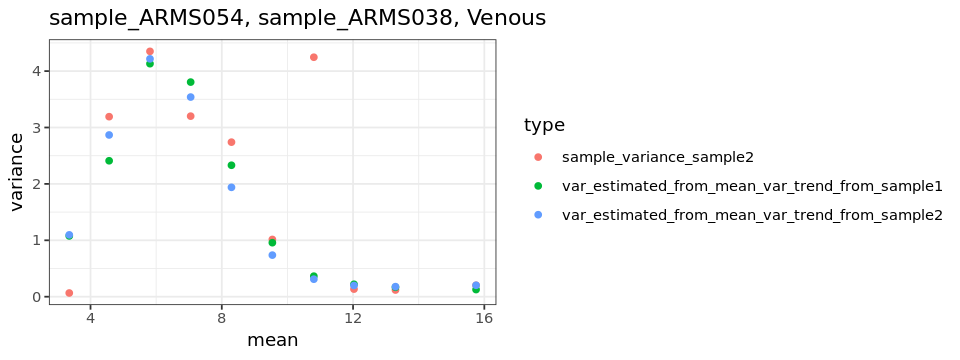

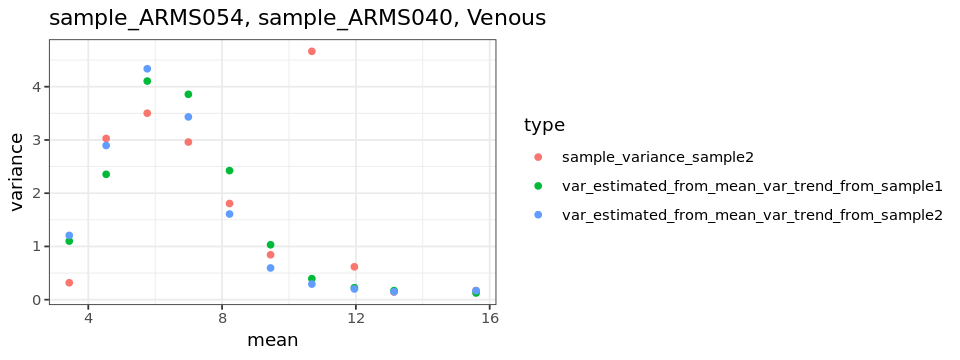

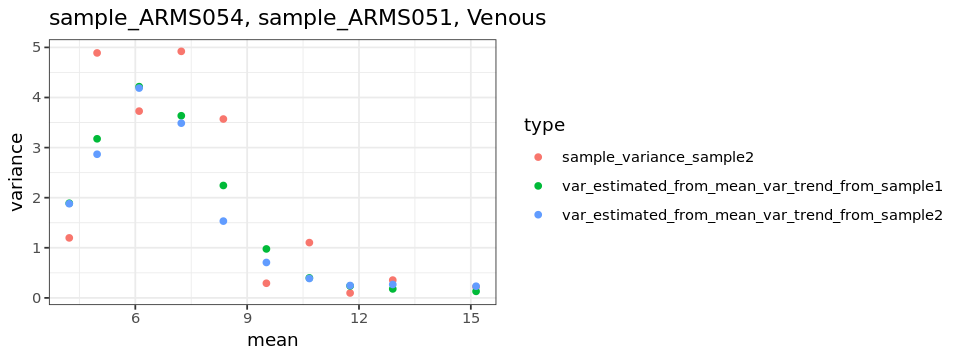

In [794]:
options(repr.plot.width = 8, repr.plot.height = 3)
for (file in myfiles){
    celltype = gsub("\\.full.*","",gsub("celltype_","",file))
    sample1 = gsub(".*\\.full_","",gsub("\\.partial_sample_.*","",file))
    sample2 = gsub(".*\\.partial_","",gsub(".csv","",file))
    filename = paste0(vb_dir,file)
    df = read.csv(filename, row.names = 1)
    plotting_df = make_plotting_df(df)
    p = ggplot(plotting_df, aes(x = mean, y = variance, col = type)) + geom_point() + theme_bw()
    print(p + ggtitle(paste0(sample1,", ",sample2,", ",celltype)))
}

In [795]:
get_distance_from_df <- function(df){
    df$dist = abs(df$sampled_variance-df$est_from_full_variance)
    mean(df$dist)
}

In [796]:
dist_df = data.frame()

In [797]:
for (file in myfiles){
    celltype = gsub("\\.full.*","",gsub("celltype_","",file))
    sample1 = gsub(".*\\.full_","",gsub("\\.partial_sample_.*","",file))
    sample2 = gsub(".*\\.partial_","",gsub(".csv","",file))
    filename = paste0(vb_dir,file)
    df = read.csv(filename, row.names = 1)
    dist = get_distance_from_df(df)
    dist_df = rbind(dist_df, data.frame(sample1 = sample1, sample2 = sample2, celltype = celltype, 
                                        avg_distance = dist, n_genes = nrow(df), 
                                        ncells_sample1 = df$n_cells_sample1[1], 
                                        ncells_sample2 = df$n_cells_sample2[1]))
}

In [798]:
head(dist_df)

sample1,sample2,celltype,avg_distance,n_genes,ncells_sample1,ncells_sample2
sample_ARMS026,sample_ARMS051,2_Cycling_cells,2.071786,10,2,58
sample_ARMS051,sample_ARMS026,2_Cycling_cells,4.533612,10,58,2
sample_ARMS026,sample_ARMS032,Airway_smooth_muscle,5.088511,10,2,2
sample_ARMS026,sample_ARMS051,Airway_smooth_muscle,1.890596,10,2,22
sample_ARMS032,sample_ARMS026,Airway_smooth_muscle,5.038508,10,2,2
sample_ARMS032,sample_ARMS051,Airway_smooth_muscle,2.739248,10,2,22


In [799]:
# library(ggplot2)

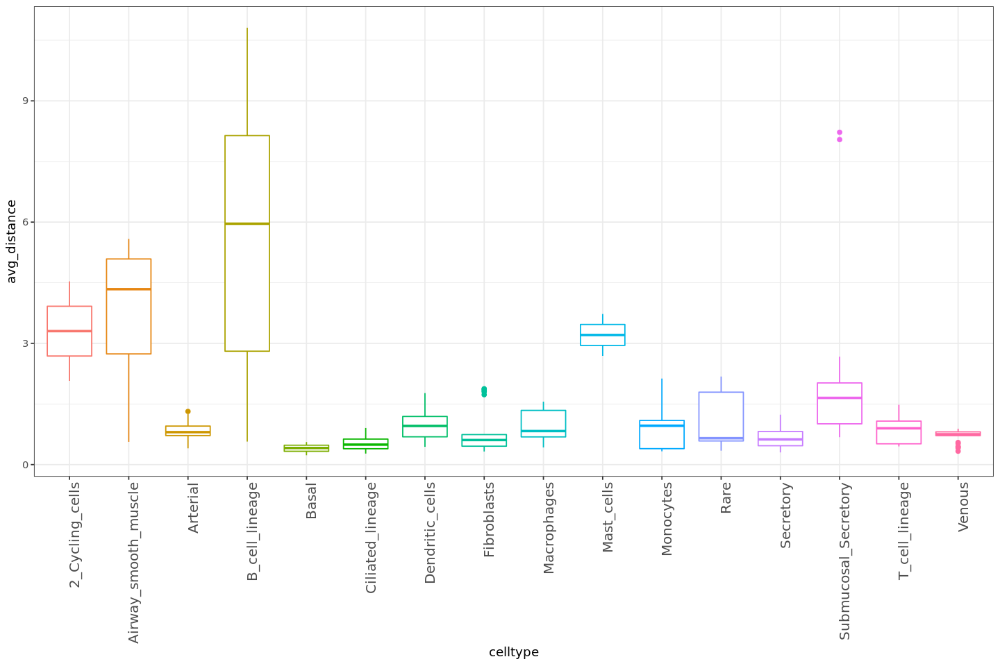

In [800]:
options(repr.plot.width = 12, repr.plot.height = 8)
ggplot(dist_df, aes(x = celltype, y = avg_distance, colour = celltype)) + geom_boxplot() + theme_bw() +
    theme(legend.position = "none", axis.text.x = element_text(angle = 90, hjust = 1, size = 12))

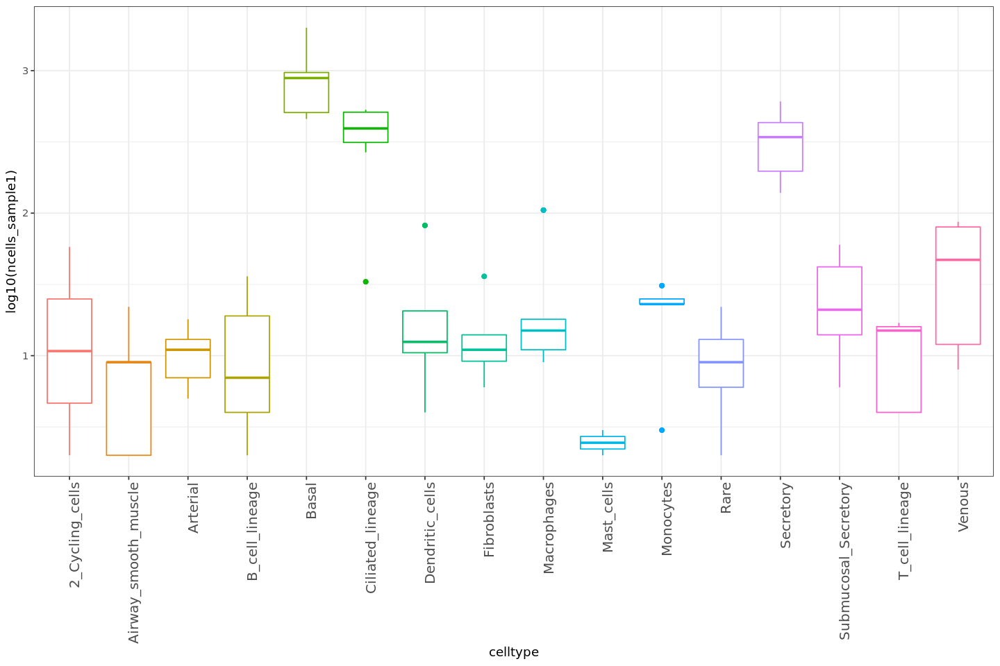

In [801]:
options(repr.plot.width = 12, repr.plot.height = 8)
ggplot(dist_df, aes(x = celltype, y = log10(ncells_sample1), colour = celltype)) + geom_boxplot() + theme_bw() +
    theme(legend.position = "none", axis.text.x = element_text(angle = 90, hjust = 1, size = 12))

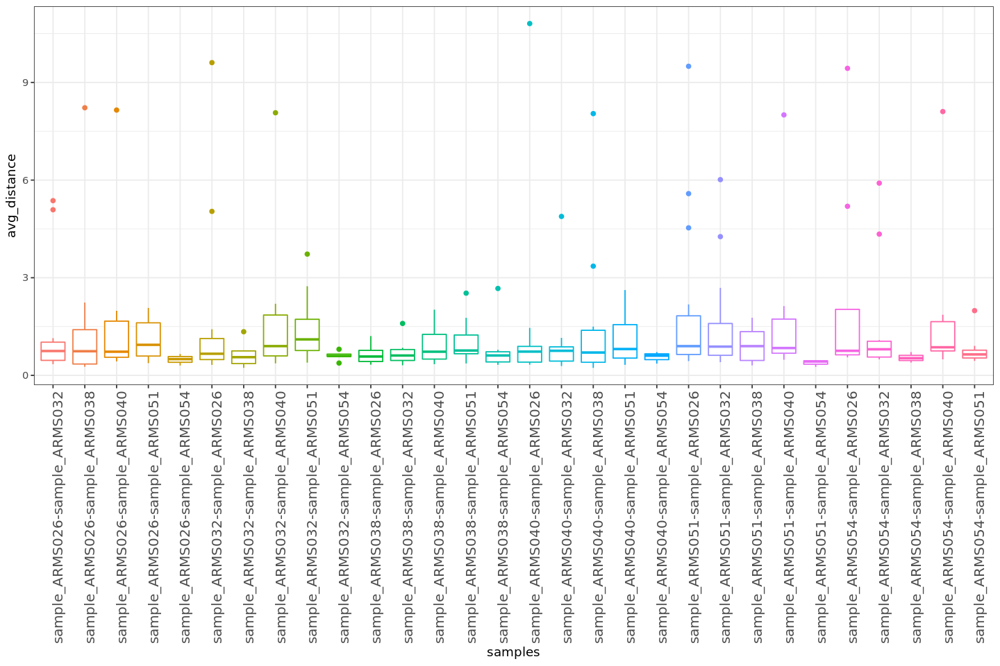

In [804]:
options(repr.plot.width = 12, repr.plot.height = 8)
dist_df$samples = paste0(dist_df$sample1,"-",dist_df$sample2)
ggplot(dist_df, aes(x = samples, y = avg_distance, colour = samples)) + geom_boxplot() + theme_bw() +
    theme(legend.position = "none", axis.text.x = element_text(angle = 90, hjust = 1, size = 12))

[1] 301

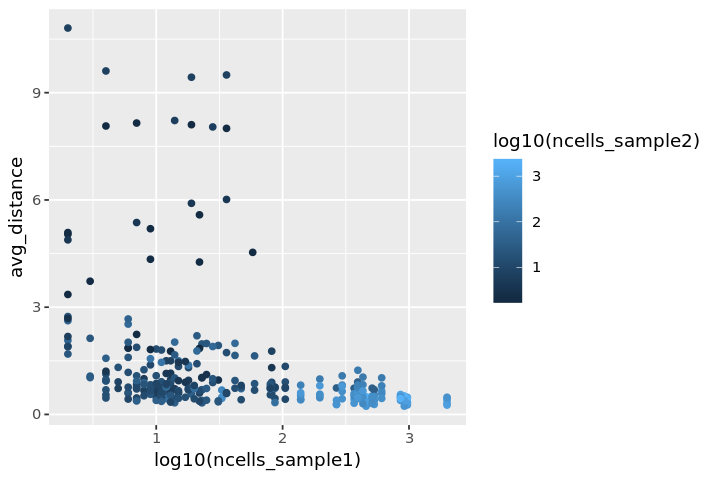

In [805]:
options(repr.plot.width = 6, repr.plot.height = 4)
nrow(dist_df)
ggplot(dist_df, aes(x = log10(ncells_sample1), y = avg_distance, colour = log10(ncells_sample2))) + geom_point()